<div style="border-width:1; border-radius: 5px; border-style: solid; border-color: rgb(10, 10, 10); background-color: purple; text-align: center;font: 14pt 'Candara';font-weight:bold;color:white"><h1>Airline passenger satisfaction</h1></div>

<center><a><img src="https://d23.com/app/uploads/2022/09/1180w-600h_090122_walts-plane-pr_00.jpg" border="3" width=800 height=600 class="center"></a>

<div style="border-width:1; border-radius: 5px; border-style: solid; border-color: rgb(10, 10, 10); background-color: purple; text-align: center;font: 14pt 'Candara';font-weight:bold;color:white"><h1>Project Description</h1></div>

**There is the following information about the passengers of some airline:**

1. **Gender:** male or female
2. **Customer type:** regular or non-regular airline customer
3. **Age:** the actual age of the passenger
4. **Type of travel:** the purpose of the passenger's flight (personal or business travel)
5. **Class:** business, economy, economy plus
6. **Flight distance**
7. **Seat comfort:** seat satisfaction level (0: not rated; 1-5)
8. **Departure/Arrival time convenient:** departure/arrival time satisfaction level (0: not rated; 1-5)
9. **Food and drink:** food and drink satisfaction level (0: not rated; 1-5)
10. **Gate location:** level of satisfaction with the gate location (0: not rated; 1-5)
11. **Inflight wifi service:** satisfaction level with Wi-Fi service on board (0: not rated; 1-5)
12. **Inflight entertainment:** satisfaction with inflight entertainment (0: not rated; 1-5)
13. **Online Support**
14. **Ease of Online booking:** online booking satisfaction rate (0: not rated; 1-5)
15. **On-board service:** level of satisfaction with on-board service (0: not rated; 1-5)
16. **Leg room service**: level of satisfaction with leg room service (0: not rated; 1-5)
17. **Baggage handling:** level of satisfaction with baggage handling (0: not rated; 1-5)
18. **Checkin service:** level of satisfaction with checkin service (0: not rated; 1-5)
19. **Cleanliness:** level of satisfaction with cleanliness (0: not rated; 1-5)
20. **Online boarding:** satisfaction level with online boarding (0: not rated; 1-5)
21. **Departure delay in minutes**
22. **Arrival delay in minutes**


This data set contains a survey on <b>air passenger satisfaction</b>. The following <b>classification problem</b> is set:

It is necessary to predict which of the <b>two</b> levels of satisfaction with the airline the passenger belongs to:
<ol>
    <li><em>Satisfaction</em></li>
    <li><em>dissatisfied</em></li>
</ol>

<div style="border-width:1; border-radius: 5px; border-style: solid; border-color: rgb(10, 10, 10); background-color: black; text-align: center;font: 14pt 'Candara';font-weight:bold;color:white"><h1>Reading data</h1></div>

# Import the main libiraries

In [1]:
import plotly.express as px
# Most important
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import missingno as msno
import warnings
warnings.filterwarnings("ignore")
import os
import plotly.express as px

# Load The DataSet

In [2]:
## Read the Csv file
data = pd.read_csv("../input/airlines-customer-satisfaction/Invistico_Airline.csv")

In [3]:
# Take a copy from dataframe to "df_air"
df_air=data.copy()

# Inspect The Data

In [4]:
# Show the head of the dataFrame 
df_air.head()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,...,4,2,2,0,2,4,2,5,0,0.0


### Each row corresponds to one passenger, and each column to a specific feature.<br>

In [5]:
# Show the Tail of the dataFrame 
df_air.tail()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
129875,satisfied,Female,disloyal Customer,29,Personal Travel,Eco,1731,5,5,5,...,2,2,3,3,4,4,4,2,0,0.0
129876,dissatisfied,Male,disloyal Customer,63,Personal Travel,Business,2087,2,3,2,...,1,3,2,3,3,1,2,1,174,172.0
129877,dissatisfied,Male,disloyal Customer,69,Personal Travel,Eco,2320,3,0,3,...,2,4,4,3,4,2,3,2,155,163.0
129878,dissatisfied,Male,disloyal Customer,66,Personal Travel,Eco,2450,3,2,3,...,2,3,3,2,3,2,1,2,193,205.0
129879,dissatisfied,Female,disloyal Customer,38,Personal Travel,Eco,4307,3,4,3,...,3,4,5,5,5,3,3,3,185,186.0


# Explore The Data

In [6]:
# Number of rows and columns 
df_air.shape

(129880, 23)

In [7]:
# Summary to all columns 
def check(df):
    l=[]
    columns=df.columns
    for col in columns:
        dtypes=df[col].dtypes
        nunique=df[col].nunique()
        sum_null=df[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    df_check=pd.DataFrame(l)
    df_check.columns=['column','dtypes','nunique','sum_null']
    return df_check 
check(df_air)

,column,dtypes,nunique,sum_null
0,satisfaction,object,2,0
1,Gender,object,2,0
2,Customer Type,object,2,0
3,Age,int64,75,0
4,Type of Travel,object,2,0
5,Class,object,3,0
6,Flight Distance,int64,5398,0
7,Seat comfort,int64,6,0
8,Departure/Arrival time convenient,int64,6,0
9,Food and drink,int64,6,0


# We divide the features into Numerical_columns and Categorical_columns

In [8]:
Categorical_columns = df_air.select_dtypes(include=['object'])
Numerical_columns = df_air.select_dtypes(exclude=['object'])

In [9]:
## Some statistics on Numerical_columns 
Numerical_columns.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,129880.0,39.427957,15.119360,7.0,27.0,40.0,51.0,85.0
Flight Distance,129880.0,1981.409055,1027.115606,50.0,1359.0,1925.0,2544.0,6951.0
Seat comfort,129880.0,2.838597,1.392983,0.0,2.0,3.0,4.0,5.0
Departure/Arrival time convenient,129880.0,2.990645,1.527224,0.0,2.0,3.0,4.0,5.0
Food and drink,129880.0,2.851994,1.443729,0.0,2.0,3.0,4.0,5.0
Gate location,129880.0,2.990422,1.305970,0.0,2.0,3.0,4.0,5.0
Inflight wifi service,129880.0,3.249130,1.318818,0.0,2.0,3.0,4.0,5.0
Inflight entertainment,129880.0,3.383477,1.346059,0.0,2.0,4.0,4.0,5.0
Online support,129880.0,3.519703,1.306511,0.0,3.0,4.0,5.0,5.0
Ease of Online booking,129880.0,3.472105,1.305560,0.0,2.0,4.0,5.0,5.0


In [10]:
## Some statistics on Categorical_columns 
Categorical_columns.describe().T

,count,unique,top,freq
satisfaction,129880,2,satisfied,71087
Gender,129880,2,Female,65899
Customer Type,129880,2,Loyal Customer,106100
Type of Travel,129880,2,Business travel,89693
Class,129880,3,Business,62160


# Comment
> ##### All columns is Numeric expcept [ ' satisfaction ' , ' Gender ' , ' Customer Type ' , ' Type of Travel ' , ' Class ' ] 

# Discovering Missing Values

In [11]:
missing=(df_air.isnull().mean().sort_values(ascending=False)*100).reset_index()
missing.rename(columns={0:"Average"},inplace=True)
missing.head()

fig=px.histogram(missing,x="Average",y="index",title="<b>% of Missing values",color="index",labels={"Average":"%age of missing values","index":"Column Names"})
fig.update_layout(
    font_color="white",
    font_size=12,
    title_font_color="cyan",
    legend_title_font_color="white",
    legend_title_font_size=20,
    template="plotly_dark",
    title_font_size=30
    
)

fig.show()

> <h3>The first 22 features have been detailed above. The <b>satisfaction</b> feature is the target.</h3>

In [12]:
df_air.columns

Index(['satisfaction', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Seat comfort',
       'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       'Departure Delay in Minutes', 'Arrival Delay in Minutes'],
      dtype='object')

# Check the Duplicates in dataset

In [13]:
df_air.duplicated().sum()

0

> - ## Thir is No duplicates in rows 

<div style="border-width:1; border-radius: 5px; border-style: solid; border-color: rgb(10, 10, 10); background-color: purple; text-align: center;font: 14pt 'Candara';font-weight:bold;color:white"><h1>Data Visualization</h1></div>

## Correlation among Features 

<AxesSubplot:>

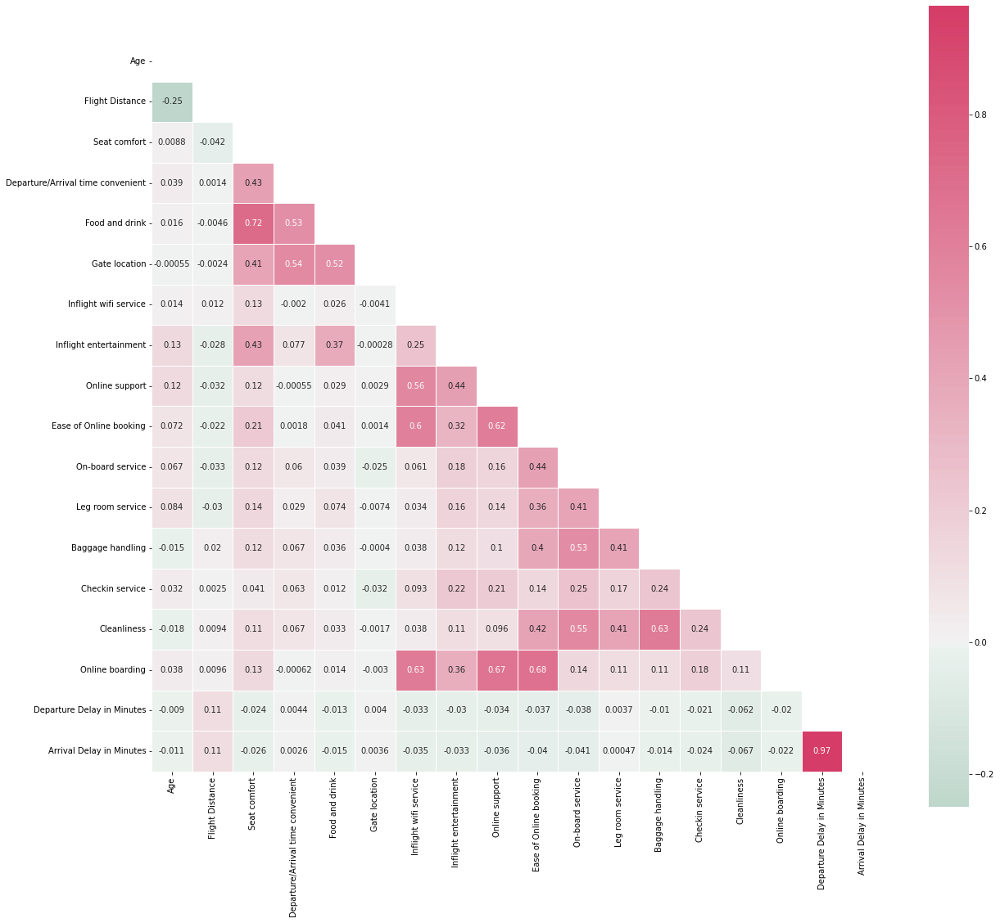

In [14]:
corr = df_air.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20, 20))
cmap = sns.diverging_palette(150, 1, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})


- There is a significat correlation between Departure Delay in Minutes and Arrival Delay in Minutes so we will drop one of 2 freatures to avoid multicolinearity problem.
- Encoding for categorical data, as our categorical columns not ordinal columns we will use getdummies function to encode them.

In [15]:
df_air = df_air.drop("Arrival Delay in Minutes",axis=1)

# 1) How Many People is Satisfied and Dissatisfied ?

In [16]:
fig=px.pie(df_air,values=df_air["satisfaction"].value_counts(),
           names=["Satisfied","Dissatisfied"],title="<b>Satisfied And Dissatisfied Ratio",
           hole=.6,
       color_discrete_sequence=px.colors.qualitative.Pastel,template="plotly")
fig.update_layout(title_font_size=30)
fig.show()

>#### 54.7% is Dissatisfied and 45.3% is Satisfied

## 2) How many women is dissatisfied and how many men is satisfied ?

In [17]:
fig=px.histogram(df_air,x="Gender",facet_col="satisfaction",color="satisfaction",color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.update_layout(title="<b>"+"Gender"+" vs satisfaction", title_font_size=30,
                     font_size=20,
                     title_x=0.5,
                     hoverlabel_font_size=20,template="plotly")

fig.show()

-  As we see the number of males and females almost the same there is a slightly differene.
-  As we said before the count of males and females almost the same, that leads to it's correlation with satisfaction of the passenger is low
-From the plot we can see that the percentage of the man that is dissatisfied is more the percentage of women 


# 3) What type of customer we have and which type that has the most satisfied people ?

In [18]:
fig=px.violin(df_air,y="Age",x="Customer Type",color="satisfaction",title="<b>Age vs Customer Type vs satisfaction")
fig.update_layout(template="plotly")
fig.show()

- our Loyal Customers much more than Disloyal Customers that looks good for our services. 
- As we see Disloyal Customers have less dissatisfaction than the loyel customers 
- in Loyal Customers we have more dissatisfaction and that's a problem.

 # 4) Which type of customers and which class has more dissatisfied people ?

In [19]:
fig1 = px.sunburst(df_air,path=["Customer Type","satisfaction"],template="plotly")
fig1.show()

> ##### loyal customer has more dissatisified customers

In [20]:
fig2 = px.sunburst(df_air,path=["Class","satisfaction"],template="plotly_white")
fig2.show()

 
> ##### Eco Class has more dissatisified customers 
 
- conclusion:
> Most dissatisfied customer is loyal customers and in Eco class

# 5) What is the ages of the customers who is satisfied and dissatisfied

In [21]:
    featue = "Age"
    fig=px.violin(df_air,x=featue,color="satisfaction",title="<b>"+featue+" Distribution",template="plotly_white" )
    fig.update_layout(hovermode='x',title_font_size=30)
    fig.update_layout(
    title_font_color="black",
    template="plotly",
    title_font_size=30,
    hoverlabel_font_size=20,
    title_x=0.5
    )
    fig.show()

- the customers from 20-35 is the most dissatisfied
- the customers from 40-60 is the most satisfied

- We noticed from the graph that most of Young people is not satisfied with the service,Although The old people that their age range is between 40 to 60 is satisfied with the service.
> Our conclusion from that the company care more about old people


# 6) Which class has more dissatisfied people ?

In [22]:
fig=px.histogram(df_air,x="Class",color="satisfaction",title="<b>Count of satisfied and dissatisfied in each class",
                color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(template="plotly")
fig.update_layout(title_font_size=30)
fig.show()

>  We discoverd from the graph that the more dissatisfied people is in class Eco

# 7) Is the flight distance is an important factor that affect the dissatisfaction process ?

In [23]:
x="Flight Distance"
fig=px.histogram(df_air,x="Flight Distance",color="satisfaction",title="<b>"+x+" Distribution",template="plotly_white",opacity=0.5)
fig.update_layout(hovermode='x',title_font_size=30)
fig.update_layout(
title_font_color="white",
template="plotly",
title_font_size=30,
hoverlabel_font_size=20,
title_x=0.5
)
fig.show()

# 8) Is the Departure/Arrival time convenient with the passengers ?

In [24]:
x="Departure/Arrival time convenient"
fig=px.histogram(df_air,x=x,color="satisfaction",title="<b>"+x+" Distribution",template="plotly_white",opacity=0.5)
fig.update_layout(hovermode='x',title_font_size=30)
fig.update_layout(
title_font_color="white",
template="plotly",
title_font_size=30,
hoverlabel_font_size=20,
title_x=0.5
)
fig.show()

# 9) which factors that affect the dissatisfied people ?

In [25]:
    fig=px.violin(df_air ,y="Flight Distance",x="satisfaction",color="Seat comfort",template="plotly_white")
    fig.update_layout(hovermode='x',title_font_size=30)
    fig.update_layout(
    title_font_color="black",
    template="plotly",
    title_font_size=30,
    hoverlabel_font_size=20,
    title_x=0.5
    )
    fig.show()

> The more people the dissatisifed with seat comfort service, The flight distance is from 2000 to 3000 km 

# 10) What is the ages of people that dissatisified with On-board service ?

In [26]:
fig=px.box(data_frame=df_air,y="Age",x="On-board service",color="satisfaction",
           color_discrete_sequence=[" #ff751a","#ff3399"],title="<b>Age Vs Sex")
fig.update_layout(template="plotly")

fig.show()

> Ages of people that dissatisified with On-board service their age concentrated between 43 to 66 years old

In [27]:
df_air.columns

Index(['satisfaction', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Seat comfort',
       'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       'Departure Delay in Minutes'],
      dtype='object')

In [28]:
import plotly.express as px
df = px.data.tips()
fig = px.box(df_air, x="Inflight wifi service", y="Online boarding")
fig.show()

In [29]:
x_predictor_col = ['Departure/Arrival time convenient','Inflight wifi service', 'Online support',
       'Ease of Online booking', 'On-board service', 'Checkin service', 'Cleanliness',
       'Food and drink']

In [30]:
def create_plot_pivot(df, x_column):
    _df_plot = df.groupby([x_column, 'satisfaction']).size() \
    .reset_index().pivot(columns='satisfaction', index=x_column, values=0)
    return _df_plot

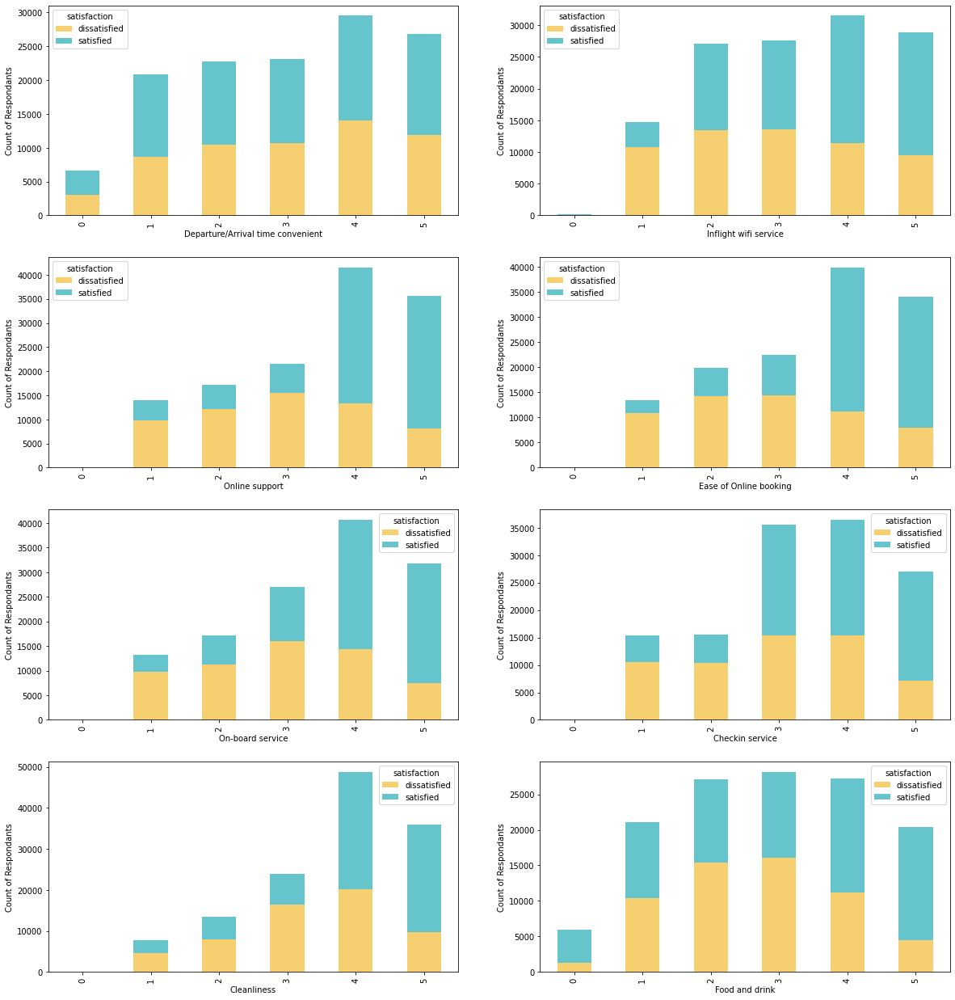

In [31]:
fig, ax = plt.subplots(4,2 , figsize=(20,22))
axe = ax.ravel()

for i in range(0,8):
    create_plot_pivot(data, x_predictor_col[i]).plot(kind='bar',stacked=True, ax=axe[i],color=["#F6CF71","#66C5CC"])
    plt.xlabel(x_predictor_col[i])
    axe[i].set_ylabel('Count of Respondants')
fig.show()

# insights

- > Ease of online booking is an important factor affect the satisfaction 
- > online suuport is an important factor affect the satisfaction 
- > on board service is an important factor affect the satisfaction 

In [32]:
fig=px.histogram(df_air,x="Type of Travel",facet_col="satisfaction",color="satisfaction")
fig.update_layout(title="<b>"+"Type of Travel"+" vs satisfaction", title_font_size=20,
                     font_size=20,
                     title_x=0.5,
                     hoverlabel_font_size=20,template="plotly")

fig.show()

# Notes 
- We have only 2 types of travel Personal Travel and Business Travel
- Out Business Travel much more than Personal Travel.
- That means we are working with Customers in Business Layer more

# Encoding For object features

In [33]:
for i in df_air.select_dtypes(include=['object']):
        le = LabelEncoder()
        df_air[i] = le.fit_transform(df_air[i])

# Preprocessing

In [34]:
df_air.isnull().sum()

satisfaction                         0
Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Seat comfort                         0
Departure/Arrival time convenient    0
Food and drink                       0
Gate location                        0
Inflight wifi service                0
Inflight entertainment               0
Online support                       0
Ease of Online booking               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Cleanliness                          0
Online boarding                      0
Departure Delay in Minutes           0
dtype: int64

>## Discovering the Outliers 

In [35]:
Q1 = df_air.quantile(0.25)
Q3 = df_air.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

satisfaction                            1.0
Gender                                  1.0
Customer Type                           0.0
Age                                    24.0
Type of Travel                          1.0
Class                                   1.0
Flight Distance                      1185.0
Seat comfort                            2.0
Departure/Arrival time convenient       2.0
Food and drink                          2.0
Gate location                           2.0
Inflight wifi service                   2.0
Inflight entertainment                  2.0
Online support                          2.0
Ease of Online booking                  3.0
On-board service                        1.0
Leg room service                        3.0
Baggage handling                        2.0
Checkin service                         1.0
Cleanliness                             2.0
Online boarding                         2.0
Departure Delay in Minutes             12.0
dtype: float64


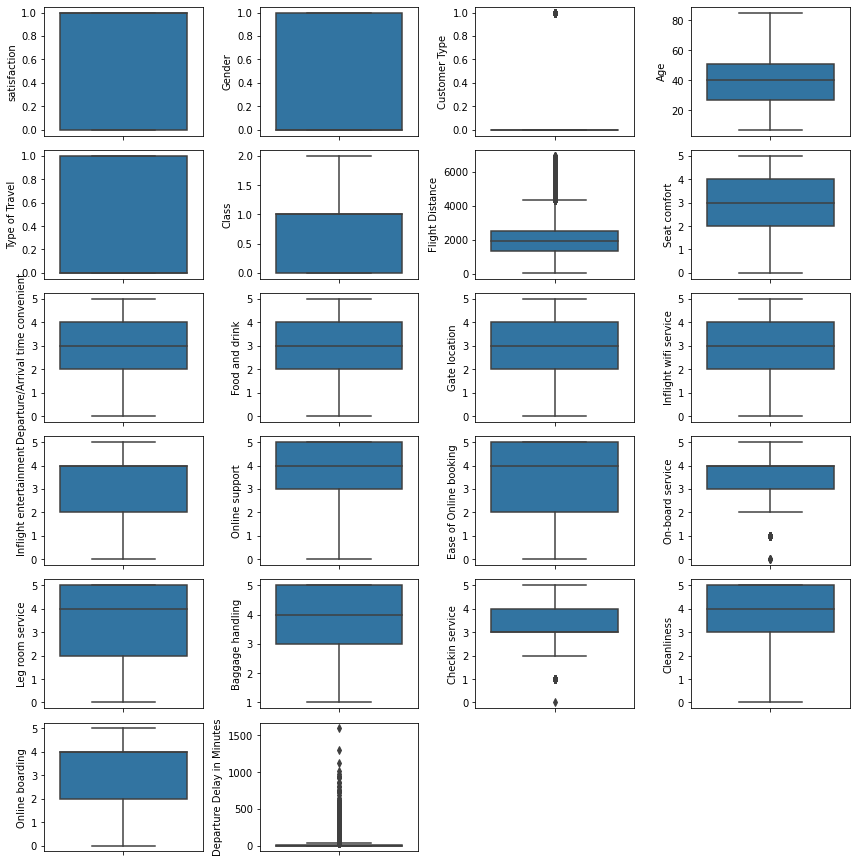

In [36]:
fig = plt.figure(figsize=(12,18))
for i in range(len(df_air.columns)):
    fig.add_subplot(9,4,i+1)
    sns.boxplot(y=df_air.iloc[:,i])

plt.tight_layout()
plt.show()

In [37]:
from collections import Counter
def detect_outliers(df,features):
    outlier_indices=[]
    
    for c in features:
        Q1=np.percentile(df[c],25)
        
        Q3=np.percentile(df[c],75)
        
        IQR= Q3-Q1
        
        outlier_step= IQR * 1.5
        
        outlier_list_col = df[(df[c]< Q1 - outlier_step)|( df[c] > Q3 + outlier_step)].index
        
        outlier_indices.extend(outlier_list_col)
    
    outliers_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i , v in outliers_indices.items() if v>2 )
    return multiple_outliers

In [38]:
df_air.loc[detect_outliers(df_air,['Age', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service','Leg room service',
       'Baggage handling', 'Checkin service',
       'Cleanliness', 'Departure Delay in Minutes'])]

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes
7239,0,0,0,55,1,1,4338,1,5,1,...,5,4,1,1,4,5,4,4,4,176
21607,0,1,0,36,1,1,4438,3,2,3,...,3,3,1,1,4,3,3,4,3,122
22092,0,0,0,58,1,2,5945,3,2,3,...,1,5,3,1,3,3,5,2,5,60
22692,0,0,0,64,1,1,5603,3,3,3,...,1,1,2,2,2,2,1,5,1,358
23003,0,1,0,69,1,1,4692,3,3,3,...,3,3,4,1,3,4,3,2,3,181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123424,1,0,0,38,0,2,1456,5,1,1,...,5,5,5,1,1,5,1,2,5,41
123567,1,1,0,36,0,1,1703,5,4,4,...,5,5,5,1,5,4,1,3,5,64
127460,1,0,0,32,0,0,4041,4,1,4,...,5,5,5,1,4,4,1,3,5,34
128995,1,1,0,40,0,1,1938,5,2,3,...,5,5,5,1,3,4,1,4,5,105


In [39]:
df_air = df_air.drop(detect_outliers(df_air,[ 'Age', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service','Leg room service',
       'Baggage handling', 'Checkin service',
       'Cleanliness', 'Departure Delay in Minutes']),axis = 0).reset_index(drop = True)

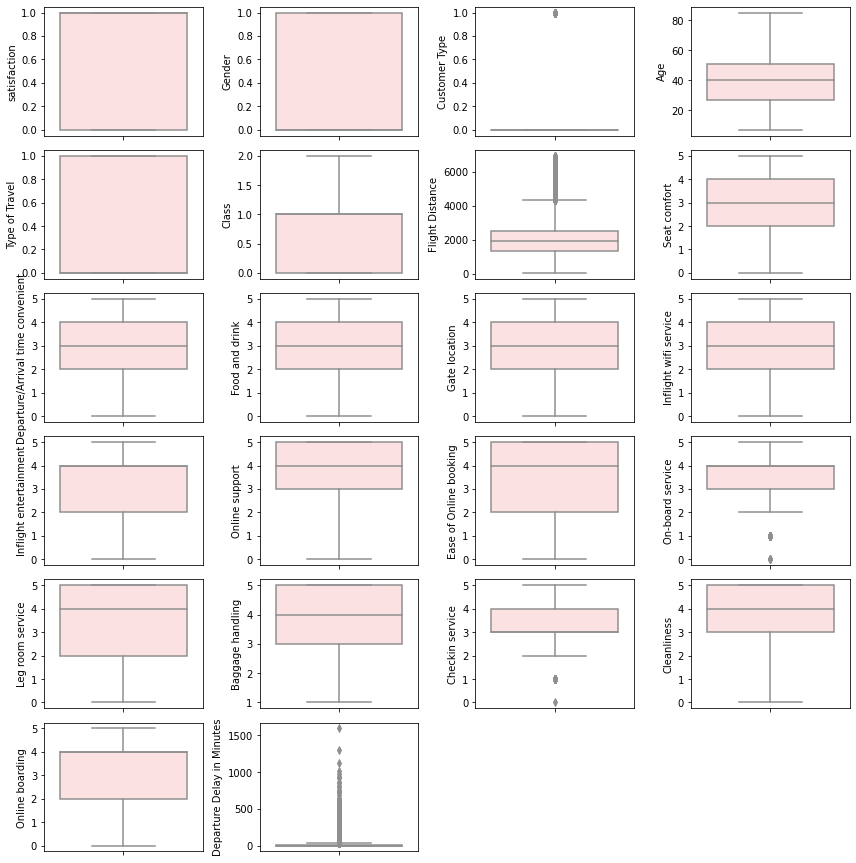

In [40]:
fig = plt.figure(figsize=(12,18))
for i in range(len(df_air.columns)):
    fig.add_subplot(9,4,i+1)
    sns.boxplot(y=df_air.iloc[:,i],color="#FFDDDD")

plt.tight_layout()
plt.show()

## Feature Selection

>#### we have two methods that we will use to detect the best related features to our Target
>#### - Chi-Square
>#### - Feature Importance using Wrapper Method 
>#### - Feature Permutation Importance

In [41]:
from sklearn import preprocessing
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(df_air)
modified_data = pd.DataFrame(r_scaler.transform(df_air), columns=df_air.columns)
modified_data.head()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes
0,1.0,0.0,0.0,0.743590,1.0,0.5,0.031155,0.0,0.0,0.0,...,0.8,0.4,0.6,0.6,0.0,0.50,1.0,0.6,0.4,0.000000
1,1.0,1.0,0.0,0.512821,1.0,0.0,0.349804,0.0,0.0,0.0,...,0.4,0.4,0.6,0.8,0.8,0.75,0.4,0.6,0.4,0.194724
2,1.0,0.0,0.0,0.102564,1.0,0.5,0.302565,0.0,0.0,0.0,...,0.0,0.4,0.4,0.6,0.6,0.75,0.8,0.8,0.4,0.000000
3,1.0,0.0,0.0,0.679487,1.0,0.5,0.083031,0.0,0.0,0.0,...,0.8,0.6,0.2,0.2,0.0,0.00,0.8,0.2,0.6,0.000000
4,1.0,0.0,0.0,0.807692,1.0,0.5,0.044052,0.0,0.0,0.0,...,0.6,0.8,0.4,0.4,0.0,0.25,0.8,0.4,1.0,0.000000


## Top 10 Feature Selection through Chi-Square¶

In [42]:
from sklearn.feature_selection import SelectKBest, chi2 
X = modified_data.loc[:,modified_data.columns!='satisfaction'] 
y = modified_data[['satisfaction']] 
selector = SelectKBest(chi2, k=10) 
selector.fit(X, y) 
X_new = selector.transform(X) 
print(X.columns[selector.get_support(indices=True)])

Index(['Gender', 'Customer Type', 'Type of Travel', 'Class',
       'Inflight entertainment', 'Online support', 'Ease of Online booking',
       'On-board service', 'Leg room service', 'Online boarding'],
      dtype='object')


## Feature Importance using Wrapper Method


In [43]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier as rf

X = df_air.drop('satisfaction', axis=1)
y = df_air['satisfaction']
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
support = selector.get_support()
features = X.loc[:,support].columns.tolist()
print(features)
print(rf(n_estimators=100, random_state=0).fit(X,y).feature_importances_)

['Seat comfort', 'Inflight entertainment', 'Online support', 'Ease of Online booking']
[0.03312765 0.04548771 0.03242325 0.02964883 0.03816626 0.03771887
 0.14064488 0.02435838 0.0399856  0.02143006 0.01654909 0.18105274
 0.0671328  0.07533283 0.04306187 0.04162796 0.02441734 0.027383
 0.0284196  0.03433404 0.01769725]


>#### the model told us that the top 5 features is Seat comfort,Inflight entertainment,Online support,Ease of Online booking,Leg room service

### Feature Permutation Importance


In [44]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(rf(n_estimators=100, random_state=0).fit(X,y),random_state=1).fit(X,y)

In [45]:
eli5.show_weights(perm, feature_names = X.columns.tolist())

Weight,Feature
0.1485 ± 0.0005,Seat comfort
0.0708 ± 0.0007,Customer Type
0.0525 ± 0.0012,Inflight entertainment
0.0463 ± 0.0007,Gender
0.0333 ± 0.0009,Type of Travel
0.0326 ± 0.0005,Checkin service
0.0312 ± 0.0006,Online support
0.0277 ± 0.0005,Baggage handling
0.0252 ± 0.0006,Cleanliness
0.0223 ± 0.0006,Online boarding


>#### From all above results, finally we can combine and conclude the list of important features.

>#### Really Important Features: Seat comfort,Customer Type,Inflight_entertainment,Gender,Checkin_service

>#### Important Features: Type of Travel,Online support, Baggage handling,cleanliness,Online boarding,On_board service,Class

## Modeling 

## Modling accoding to the best features

In [46]:
modified_data.columns

Index(['satisfaction', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Seat comfort',
       'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       'Departure Delay in Minutes'],
      dtype='object')

In [47]:
x = modified_data[['Seat comfort','Inflight entertainment','Ease of Online booking','Online support','Gender',
                   'Customer Type', 'Type of Travel', 'Class','On-board service', 'Leg room service', 'Online boarding']]
y = modified_data["satisfaction"]

In [48]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state=42)

In [49]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((90463, 11), (38771, 11), (90463,), (38771,))

In [50]:
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, plot_confusion_matrix, plot_roc_curve

In [51]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, plot_roc_curve
import warnings

warnings.filterwarnings("ignore")

In [52]:
logisreg_clf = LogisticRegression()
svm_clf = SVC()
dt_clf = DecisionTreeClassifier()
rf_clf = RandomForestClassifier()
XGB_clf = XGBClassifier()

In [53]:
clf_list = [logisreg_clf, svm_clf, dt_clf, rf_clf, XGB_clf]
clf_name_list = ['Logistic Regression', 'Support Vector Machine', 'Decision Tree', 'Random Forest', 'XGBClassifier']

for clf in clf_list:
    clf.fit(X_train,y_train)

In [54]:
train_acc_list = []
test_acc_list = []

for clf,name in zip(clf_list,clf_name_list):
    y_pred_train = clf.predict(X_train)
    y_pred_test = clf.predict(X_test)
    print(f'Using model: {name}')
    print(f'Trainning Score: {clf.score(X_train, y_train)}')
    print(f'Test Score: {clf.score(X_test, y_test)}')
    print(f'Acc Train: {accuracy_score(y_train, y_pred_train)}')
    print(f'Acc Test: {accuracy_score(y_test, y_pred_test)}')
    train_acc_list.append(accuracy_score(y_train, y_pred_train))
    test_acc_list.append(accuracy_score(y_test, y_pred_test))
    print('======================================================')

Using model: Logistic Regression
Trainning Score: 0.8237843096072427
Test Score: 0.822496195610121
Acc Train: 0.8237843096072427
Acc Test: 0.822496195610121
Using model: Support Vector Machine
Trainning Score: 0.9236925593889215
Test Score: 0.9211008227799128
Acc Train: 0.9236925593889215
Acc Test: 0.9211008227799128
Using model: Decision Tree
Trainning Score: 0.9620618374362999
Test Score: 0.9297928864357381
Acc Train: 0.9620618374362999
Acc Test: 0.9297928864357381
Using model: Random Forest
Trainning Score: 0.9620618374362999
Test Score: 0.9349255887132135
Acc Train: 0.9620618374362999
Acc Test: 0.9349255887132135
Using model: XGBClassifier
Trainning Score: 0.9445740247393962
Test Score: 0.9375822135100977
Acc Train: 0.9445740247393962
Acc Test: 0.9375822135100977


# Evaluating Models 

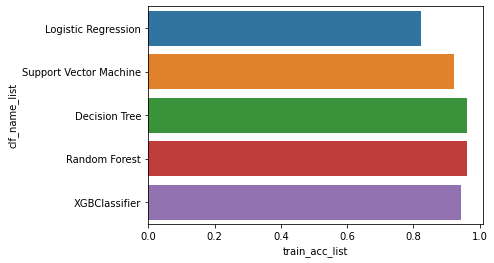

In [55]:
clf_name_list = np.array([clf_name_list]).reshape(5,1)
train_acc_list = np.array([train_acc_list]).reshape(5,1)
df = pd.DataFrame(clf_name_list,columns=["clf_name_list"])
df["train_acc_list"] = train_acc_list
sns.barplot(data=df,y="clf_name_list",x="train_acc_list");

## Model-1: Logistic Regression 

Accuracy = 0.822496195610121
ROC Area under Curve = 0.8201320313753048
Time taken = 0.2792243957519531
              precision    recall  f1-score   support

         0.0    0.80955   0.79507   0.80224     17557
         1.0    0.83287   0.84520   0.83899     21214

    accuracy                        0.82250     38771
   macro avg    0.82121   0.82013   0.82061     38771
weighted avg    0.82231   0.82250   0.82235     38771



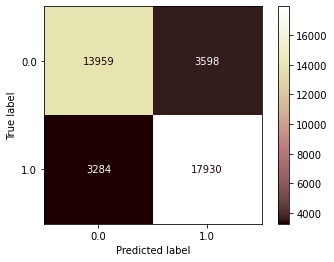

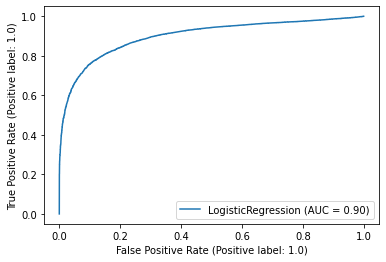

In [56]:
from sklearn.linear_model import LogisticRegression
import time
t0=time.time()
model= LogisticRegression()
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
roc_auc5 = roc_auc_score(y_test, y_pred) 
time_taken5 = time.time()-t0
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc5))
print("Time taken = {}".format(time_taken5))
print(classification_report(y_test,y_pred,digits=5))
plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.pink)
plot_roc_curve(model, X_test, y_test)    

## Model-2: Naive Bayes Classifier


Accuracy = 0.8252044053545176
ROC Area under Curve = 0.8231468383127206
Time taken = 0.05124473571777344
              precision    recall  f1-score   support

         0.0    0.81052   0.80133   0.80590     17557
         1.0    0.83711   0.84496   0.84102     21214

    accuracy                        0.82520     38771
   macro avg    0.82381   0.82315   0.82346     38771
weighted avg    0.82507   0.82520   0.82511     38771



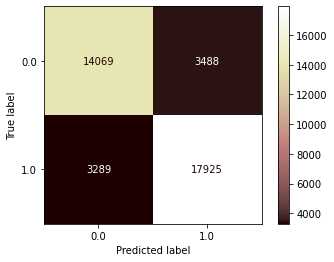

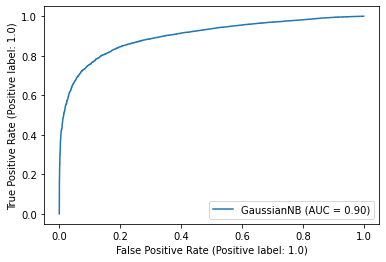

In [57]:
from sklearn.naive_bayes import GaussianNB
import time
t0=time.time()
model= GaussianNB()
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
roc_auc4 = roc_auc_score(y_test, y_pred)
time_taken1 = time.time()-t0
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc4))
print("Time taken = {}".format(time_taken1))
print(classification_report(y_test,y_pred,digits=5))
plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.pink)
plot_roc_curve(model,X_test, y_test)    

## Model-3: Decision Tree Classifier

Accuracy = 0.9321400015475484
ROC Area under Curve = 0.9320684136845198
Time taken = 0.30537939071655273
              precision    recall  f1-score   support

         0.0    0.91984   0.93131   0.92554     17557
         1.0    0.94256   0.93283   0.93767     21214

    accuracy                        0.93214     38771
   macro avg    0.93120   0.93207   0.93160     38771
weighted avg    0.93227   0.93214   0.93217     38771



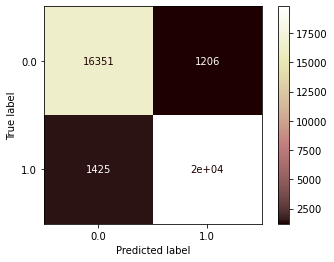

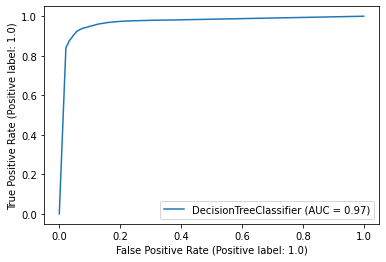

In [58]:
from sklearn.tree import DecisionTreeClassifier
import time
t0=time.time()
model=DecisionTreeClassifier(max_depth=17)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
roc_auc2 = roc_auc_score(y_test, y_pred) 
time_taken3 = time.time()-t0
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc2))
print("Time taken = {}".format(time_taken3))
print(classification_report(y_test,y_pred,digits=5))
plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.pink)
plot_roc_curve(model,X_test, y_test)   

## Model-4: Ada Boost Classifier

Accuracy = 0.8897113822186686
ROC Area under Curve = 0.8888833614381761
              precision    recall  f1-score   support

         0.0    0.87681   0.88010   0.87845     17557
         1.0    0.90046   0.89766   0.89906     21214

    accuracy                        0.88971     38771
   macro avg    0.88864   0.88888   0.88876     38771
weighted avg    0.88975   0.88971   0.88973     38771

Time taken = 31.47131037712097


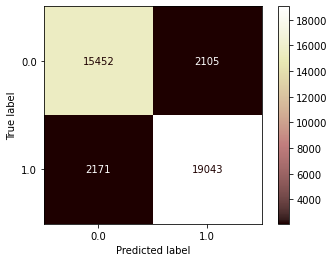

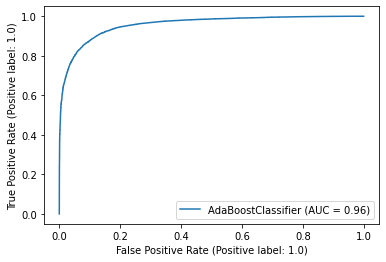

In [59]:
from sklearn.ensemble import AdaBoostClassifier as adab
import time
t0=time.time()
model=adab(n_estimators=500)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
roc_auc3 = roc_auc_score(y_test, y_pred) 
print("Accuracy = {}".format(accuracy))
time_taken4 = time.time()-t0
print("ROC Area under Curve = {}".format(roc_auc3))
print(classification_report(y_test,y_pred,digits=5))
print("Time taken = {}".format(time_taken4))
plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.pink)
plot_roc_curve(model,X_test, y_test)    

## Conclusion
* Passengers also appear to be sensitive to certain aspects of their     services and as such the airline should tackle such issues as a         priority to improve services. This includes inflight wifi and           departure time. That said, if the airline wishes to continue to focus   on business travellers aspects such as online booking and seat         comfort should be prioritised.

* There are also aspects such as ticket price, flight location also       missing from this dataset.

## Recomendation
About business, My advise to the company to improve the services that have low score for the Eco class:

* food_and_drink
* online_boarding
* seat_comfort
* inflight_entertainment
* on_board_service
* leg_room_service

## Future work
we have some questions that we thought it will help us to get to know our data more 
* was the departure delay caused by bad weather? 
* was their seatmate rude? 

we would love to know more details about the data set to get more detailed analysis